In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamzs_3chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-3677.78630744]
 [-3677.78630744]
 [-3677.78630744]
 ..., 
 [  149.60888736]
 [  149.60888736]
 [  149.60888736]]
Logp of trace:  a  chain:  1  =  [ 148.41674696]
Logp of trace:  a  chain:  2  =  [ 151.98635576]
Logp of trace:  b  chain: 0 =  [[-3157.32639876]
 [-2677.68717706]
 [-2593.54903043]
 ..., 
 [  152.56977501]
 [  152.56977501]
 [  152.56977501]]
Logp of trace:  b  chain:  1  =  [ 154.66945507]
Logp of trace:  b  chain:  2  =  [ 149.08614508]
Logp of trace:  c  chain: 0 =  [[-2596.37272973]
 [-2596.37272973]
 [-2596.37272973]
 ..., 
 [  151.20897864]
 [  151.20897864]
 [  151.20897864]]
Logp of trace:  c  chain:  1  =  [ 150.97739006]
Logp of trace:  c  chain:  2  =  [ 151.77343587]
Logp of trace:  d  chain: 0 =  [[-24390.09663357]
 [-21532.29679311]
 [-21532.29679311]
 ..., 
 [   148.41146053]
 [   148.41146053]
 [   148.41146053]]
Logp of trace:  d  chain:  1  =  [ 151.30425759]
Logp of trace:  d  chain:  2  =  [ 152.34034582]


In [6]:
traces['a'][0][:,72]

array([-1.2946061 , -1.2946061 , -1.2946061 , ..., -1.41705249,
       -1.41705249, -1.41705249])

In [7]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [8]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  39  of  88  parameters.
Percent of parameters with GR below 1.2:  44.3181818182
Number of parameters with GR below 1.1:  20  of  88  parameters.
Percent of parameters with GR below 1.1:  22.7272727273


[39, 44.31818181818182, 20, 22.727272727272727]

In [9]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  53  of  88  parameters.
Percent of parameters with GR below 1.2:  60.2272727273
Number of parameters with GR below 1.1:  33  of  88  parameters.
Percent of parameters with GR below 1.1:  37.5


[53, 60.22727272727273, 33, 37.5]

In [10]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  70  of  88  parameters.
Percent of parameters with GR below 1.2:  79.5454545455
Number of parameters with GR below 1.1:  44  of  88  parameters.
Percent of parameters with GR below 1.1:  50.0


[70, 79.54545454545455, 44, 50.0]

In [11]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  69  of  88  parameters.
Percent of parameters with GR below 1.2:  78.4090909091
Number of parameters with GR below 1.1:  43  of  88  parameters.
Percent of parameters with GR below 1.1:  48.8636363636


[69, 78.4090909090909, 43, 48.86363636363637]

50000
3
50000


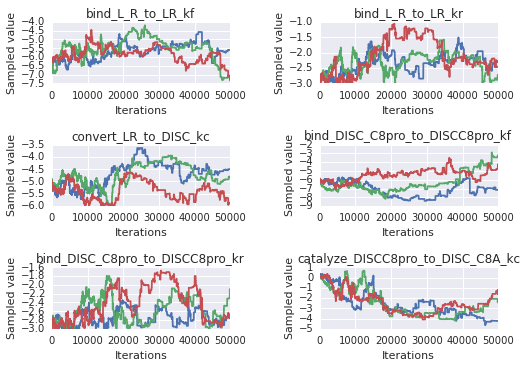

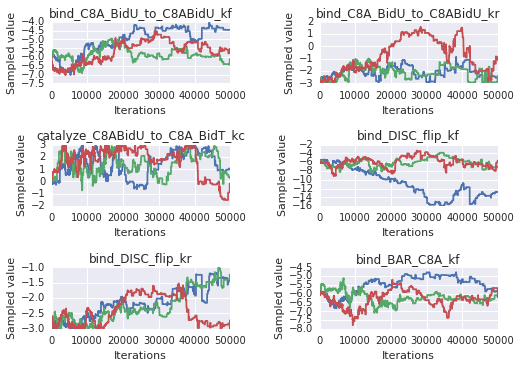

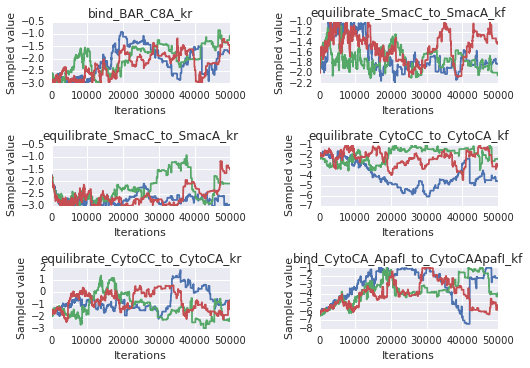

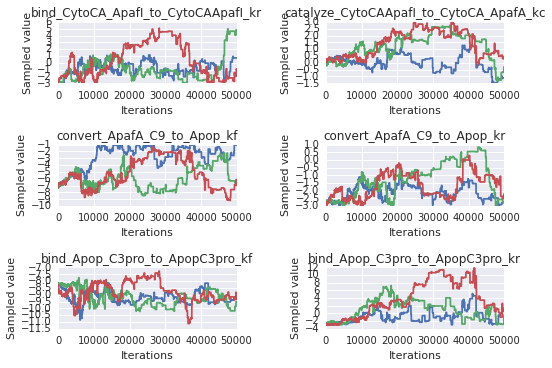

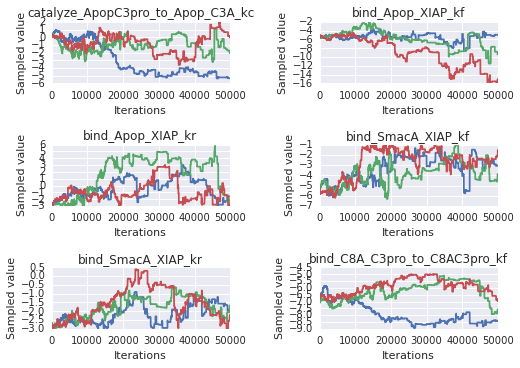

...

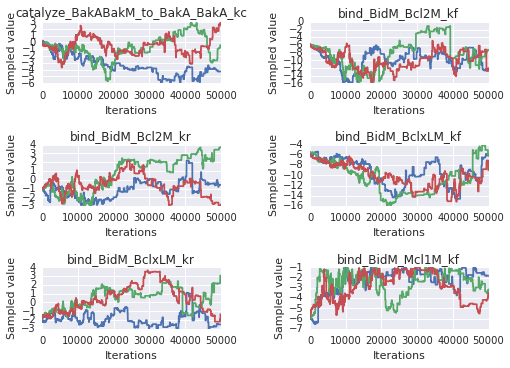

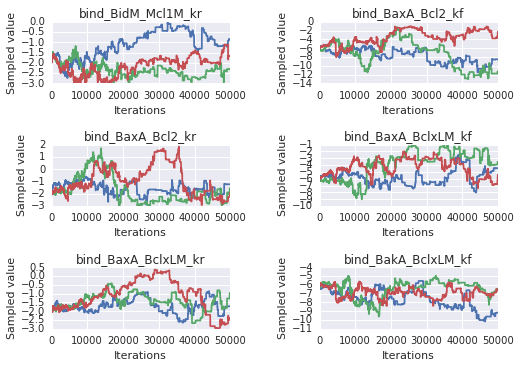

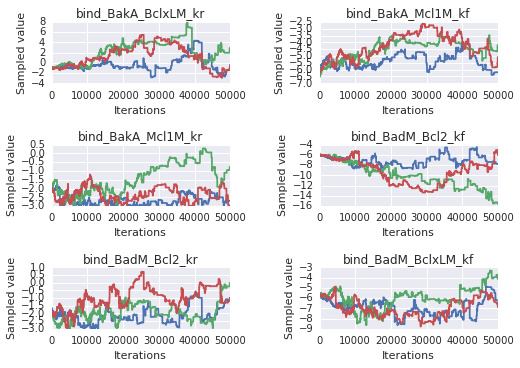

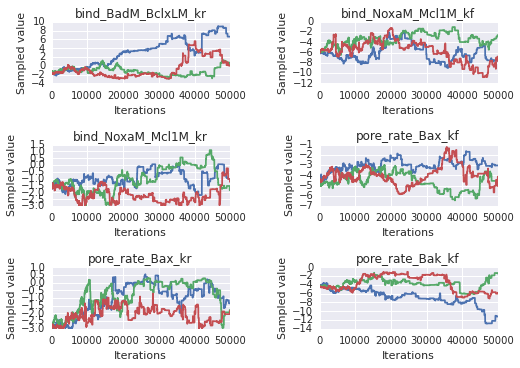

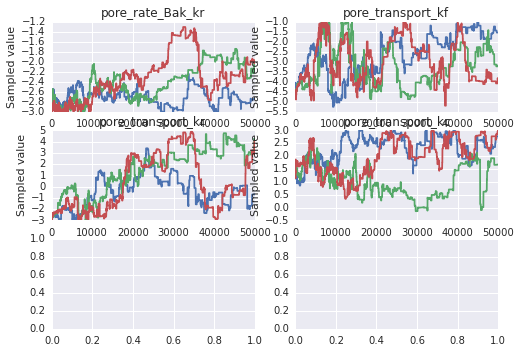

In [12]:
sample_plots(param_trace_dicts['a'])

In [13]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


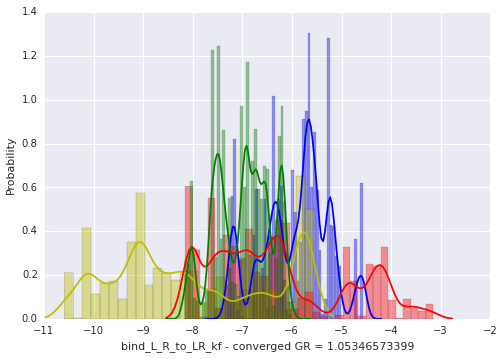

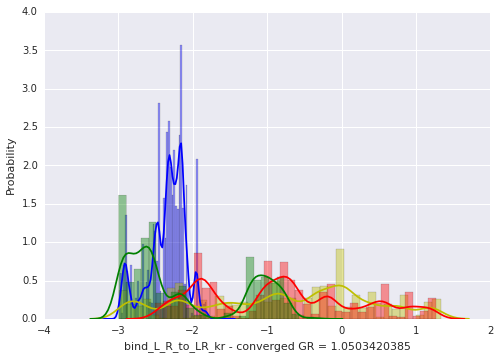

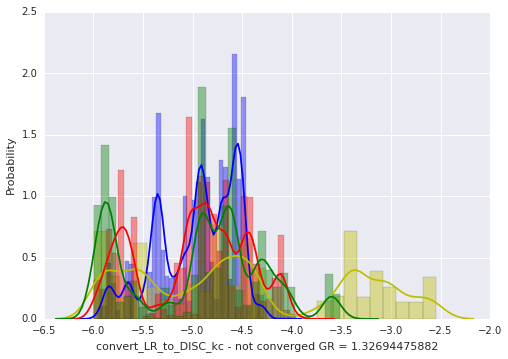

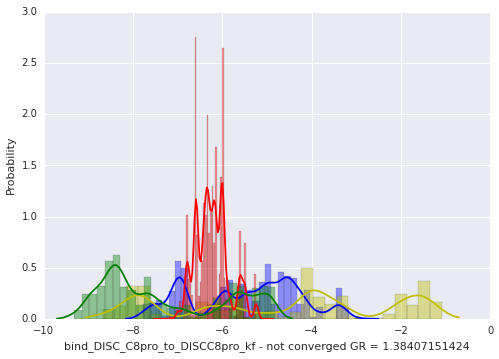

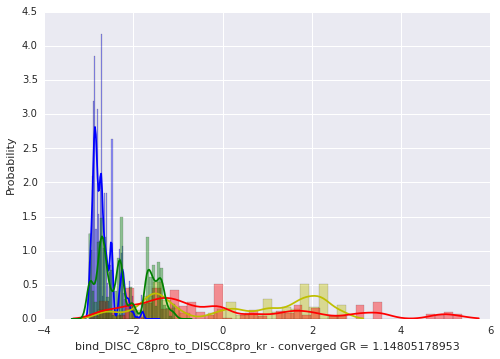

...

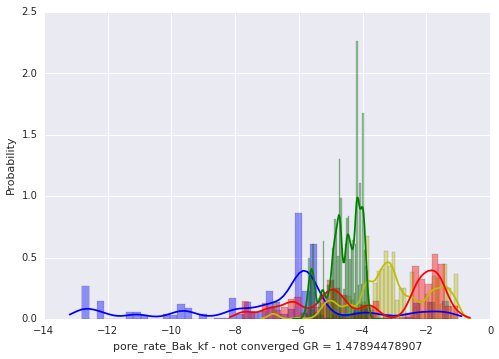

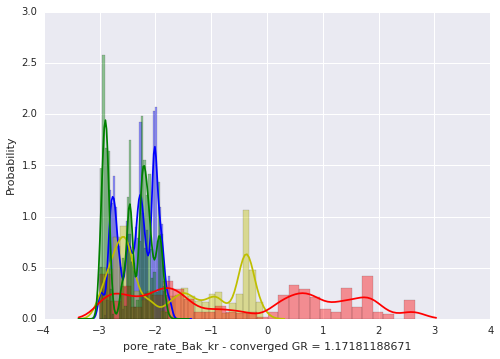

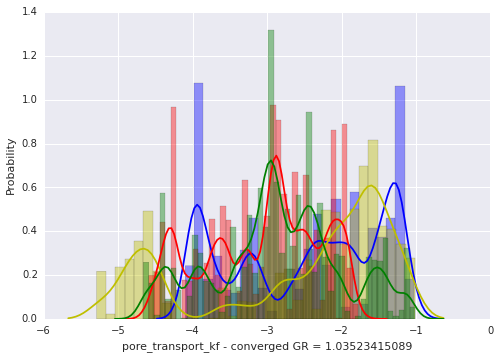

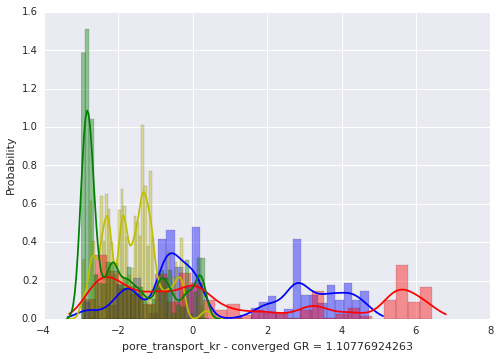

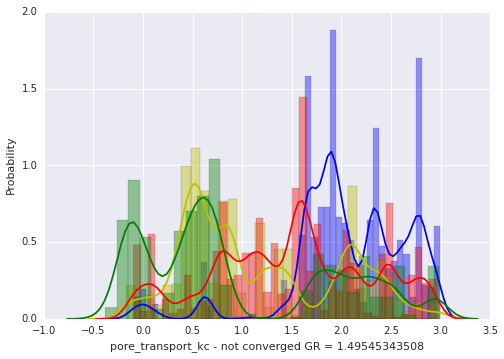

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [15]:
traces['a'][1][:,0]

array([-6.20274243, -6.20274243, -6.20274243, ..., -7.16838048,
       -7.16838048, -7.16838048])

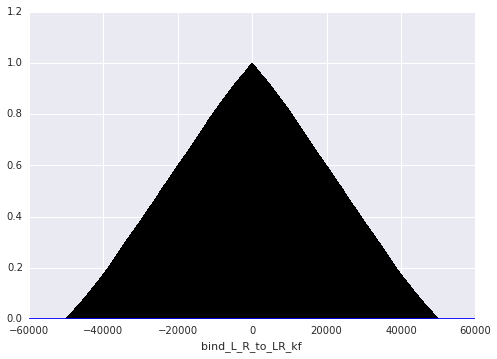

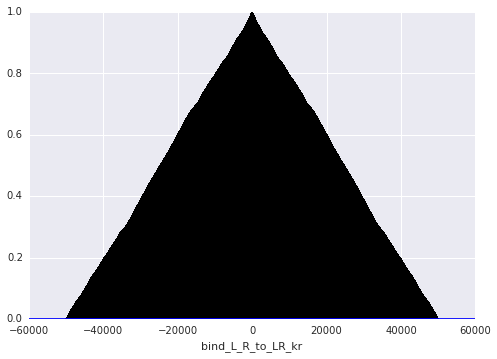

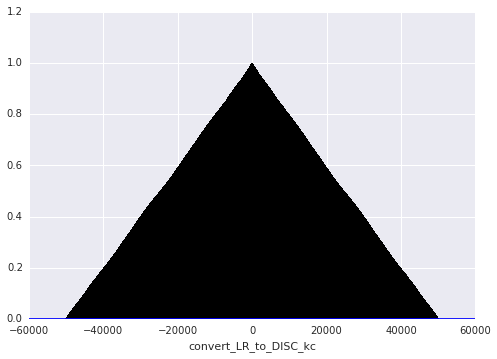

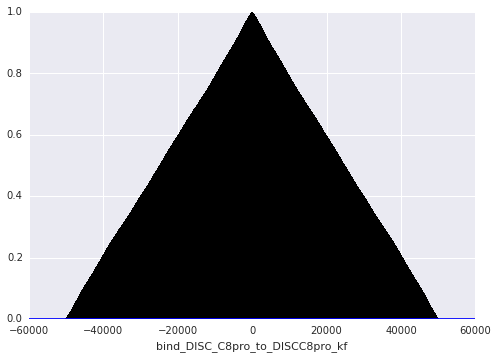

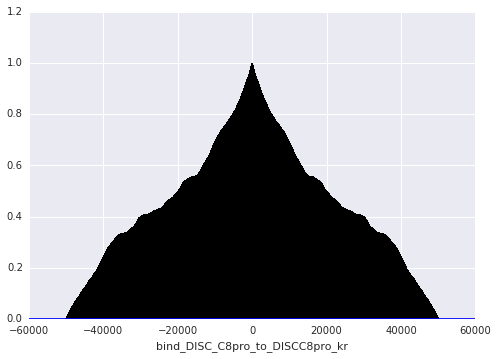

...

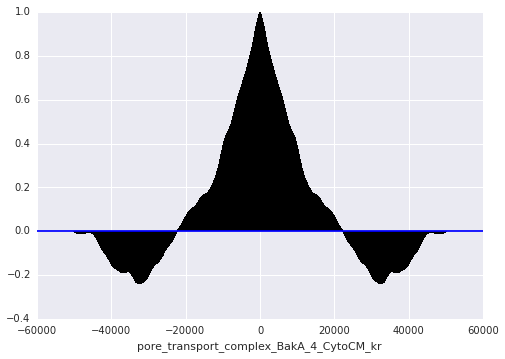

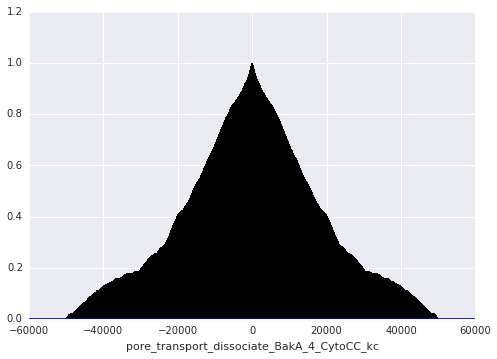

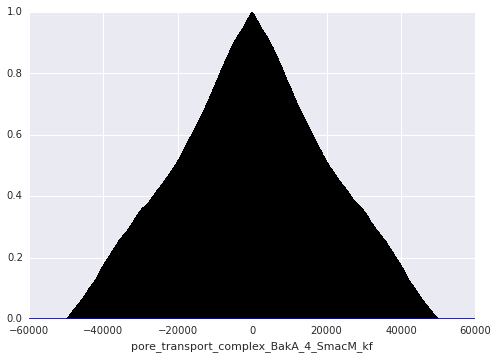

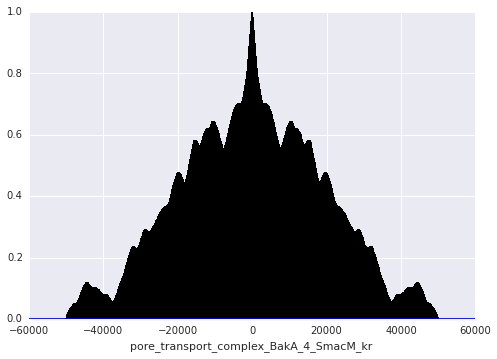

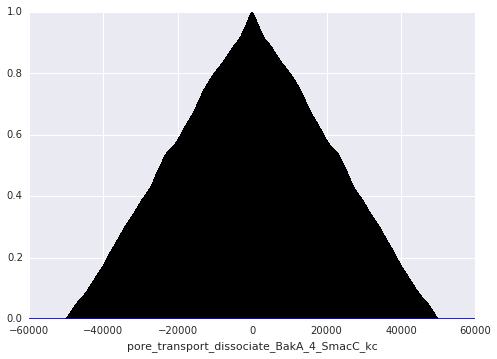

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

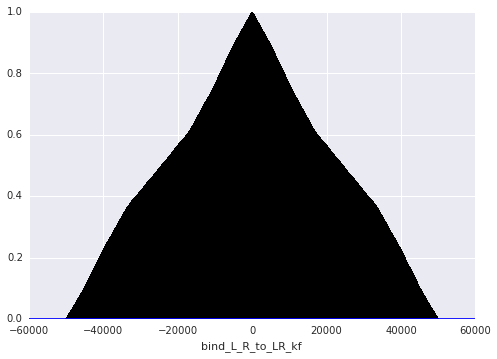

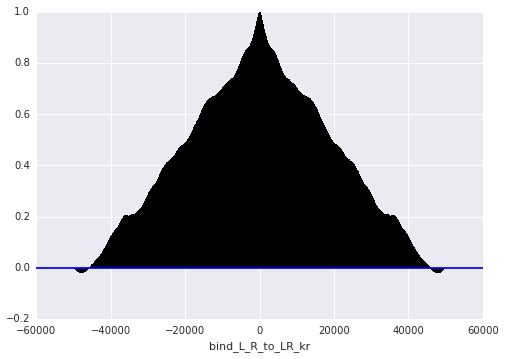

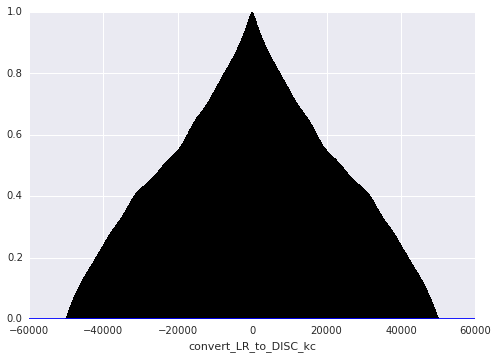

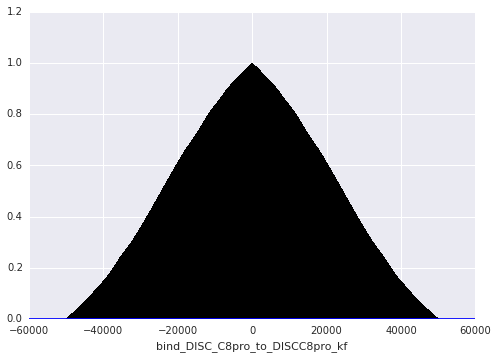

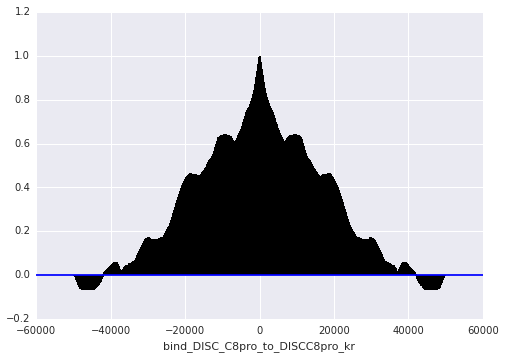

...

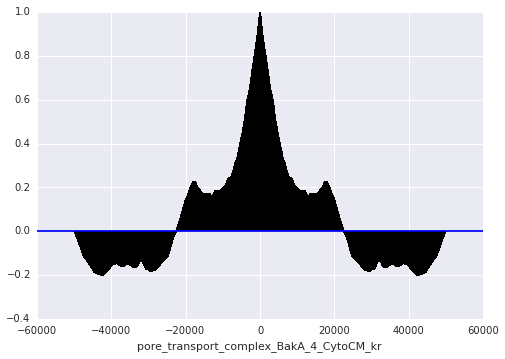

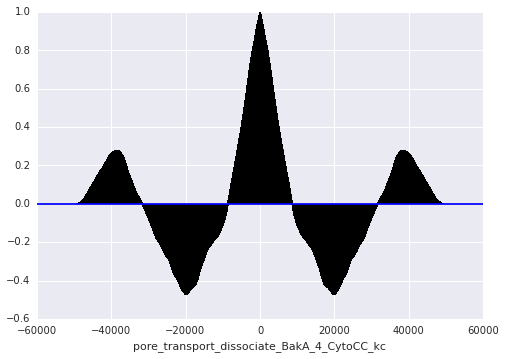

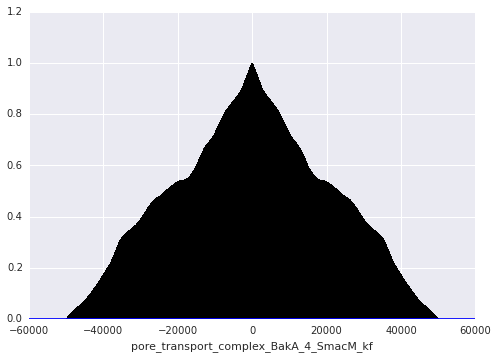

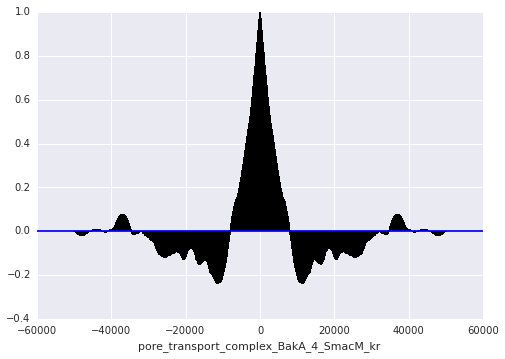

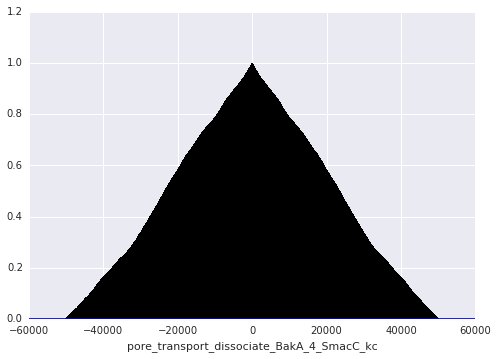

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

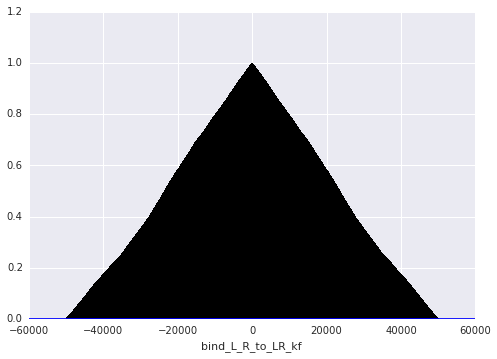

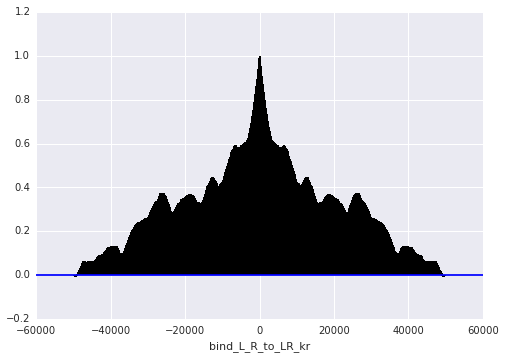

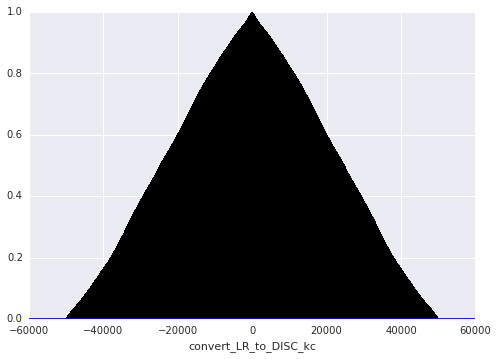

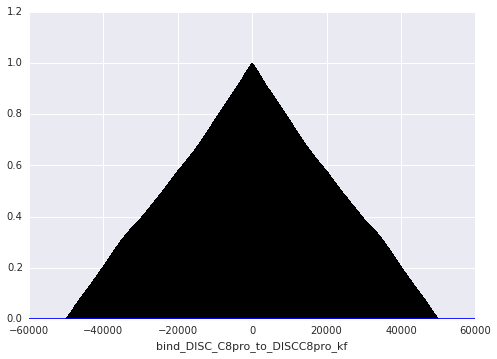

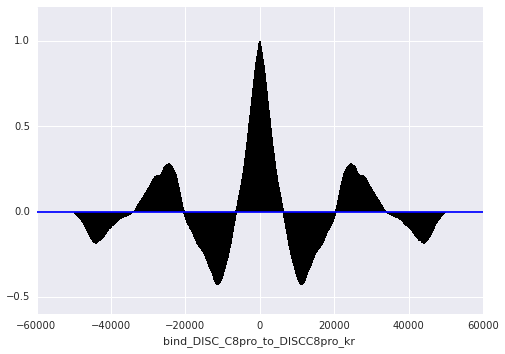

...

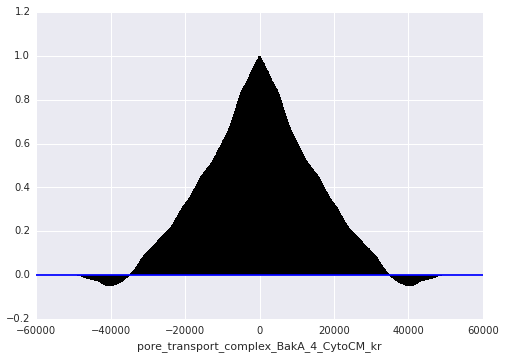

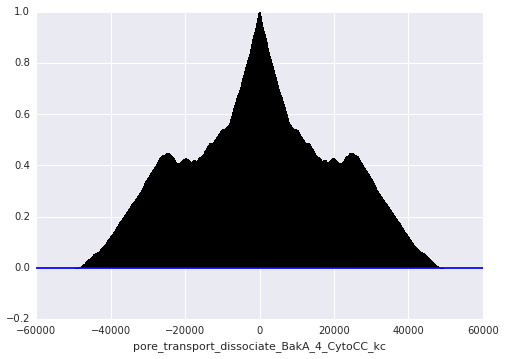

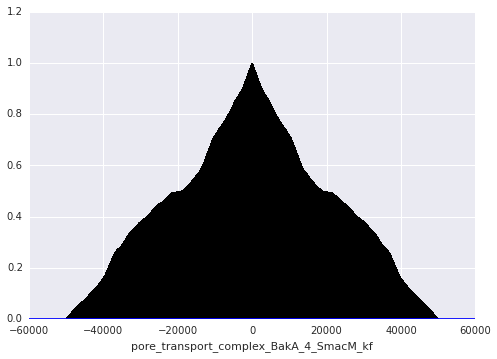

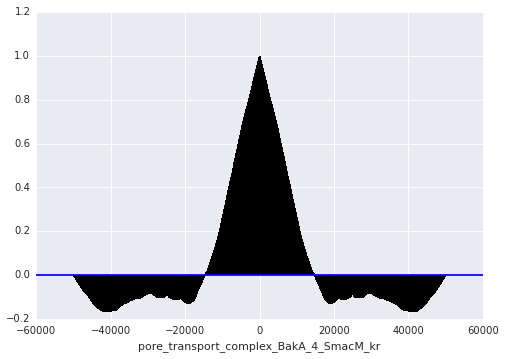

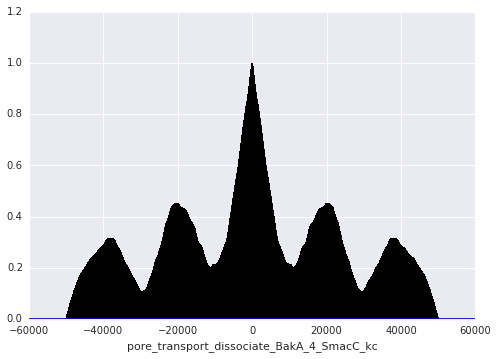

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [16]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  778  acceptance rate:  0.01556
N acceptances for parameter:  bind_L_R_to_LR_kr  =  817  acceptance rate:  0.01634
N acceptances for parameter:  convert_LR_to_DISC_kc  =  751  acceptance rate:  0.01502
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  759  acceptance rate:  0.01518
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  799  acceptance rate:  0.01598
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  764  acceptance rate:  0.01528
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  768  acceptance rate:  0.01536
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  796  acceptance rate:  0.01592
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  790  acceptance rate:  0.0158
N acceptances for parameter:  bind_DISC_flip_kf  =  811  acceptance rate:  0.01622
N acceptances for parameter:  bind_DISC_flip_kr  =  797  acceptance rate:  0.01594
N acce

array([ 0.01556,  0.01634,  0.01502,  0.01518,  0.01598,  0.01528,
        0.01536,  0.01592,  0.0158 ,  0.01622,  0.01594,  0.01474,
        0.01576,  0.01598,  0.01612,  0.01596,  0.01604,  0.01632,
        0.01634,  0.0158 ,  0.01574,  0.01584,  0.0158 ,  0.0157 ,
        0.01586,  0.01598,  0.01638,  0.01574,  0.01618,  0.0146 ,
        0.01644,  0.01612,  0.01566,  0.01562,  0.01622,  0.01532,
        0.01684,  0.01516,  0.01496,  0.016  ,  0.01652,  0.01536,
        0.01616,  0.0159 ,  0.01558,  0.01566,  0.01618,  0.01614,
        0.01616,  0.016  ,  0.0157 ,  0.01562,  0.01598,  0.01628,
        0.01604,  0.01634,  0.01608,  0.01598,  0.01626,  0.01564,
        0.01636,  0.0159 ,  0.01616,  0.01624,  0.01644,  0.01546,
        0.01586,  0.01608,  0.0161 ,  0.01574,  0.01596,  0.01642,
        0.01612,  0.01554,  0.01626,  0.0162 ,  0.01642,  0.01626,
        0.01612,  0.01612,  0.01558,  0.0157 ,  0.01512,  0.01652,
        0.01576,  0.01586,  0.01558,  0.01624])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  852  acceptance rate:  0.01704
N acceptances for parameter:  bind_L_R_to_LR_kr  =  816  acceptance rate:  0.01632
N acceptances for parameter:  convert_LR_to_DISC_kc  =  771  acceptance rate:  0.01542
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  766  acceptance rate:  0.01532
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  830  acceptance rate:  0.0166
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  797  acceptance rate:  0.01594
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  755  acceptance rate:  0.0151
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  817  acceptance rate:  0.01634
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  829  acceptance rate:  0.01658
N acceptances for parameter:  bind_DISC_flip_kf  =  829  acceptance rate:  0.01658
N acceptances for parameter:  bind_DISC_flip_kr  =  808  acceptance rate:  0.01616
N accep

array([ 0.01704,  0.01632,  0.01542,  0.01532,  0.0166 ,  0.01594,
        0.0151 ,  0.01634,  0.01658,  0.01658,  0.01616,  0.01574,
        0.01608,  0.01634,  0.01526,  0.01718,  0.01652,  0.01672,
        0.01636,  0.01702,  0.01638,  0.01614,  0.01588,  0.01608,
        0.01718,  0.01612,  0.01676,  0.0165 ,  0.01658,  0.01484,
        0.01672,  0.0165 ,  0.01474,  0.01654,  0.01638,  0.01544,
        0.01586,  0.01624,  0.01496,  0.01672,  0.01626,  0.01528,
        0.01658,  0.01598,  0.0166 ,  0.01598,  0.01662,  0.01576,
        0.01658,  0.01672,  0.01624,  0.01668,  0.01632,  0.01616,
        0.01616,  0.0167 ,  0.01628,  0.01654,  0.01638,  0.01644,
        0.01642,  0.01648,  0.01624,  0.01648,  0.0169 ,  0.0163 ,
        0.01672,  0.01678,  0.0167 ,  0.01662,  0.01626,  0.01654,
        0.01672,  0.01576,  0.01672,  0.01658,  0.01606,  0.0162 ,
        0.01598,  0.01622,  0.01642,  0.01658,  0.01694,  0.01624,
        0.01634,  0.01618,  0.01648,  0.0168 ])

In [18]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  896  acceptance rate:  0.01792
N acceptances for parameter:  bind_L_R_to_LR_kr  =  882  acceptance rate:  0.01764
N acceptances for parameter:  convert_LR_to_DISC_kc  =  845  acceptance rate:  0.0169
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  871  acceptance rate:  0.01742
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  926  acceptance rate:  0.01852
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  886  acceptance rate:  0.01772
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  840  acceptance rate:  0.0168
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  907  acceptance rate:  0.01814
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  912  acceptance rate:  0.01824
N acceptances for parameter:  bind_DISC_flip_kf  =  900  acceptance rate:  0.018
N acceptances for parameter:  bind_DISC_flip_kr  =  905  acceptance rate:  0.0181
N acceptan

array([ 0.01792,  0.01764,  0.0169 ,  0.01742,  0.01852,  0.01772,
        0.0168 ,  0.01814,  0.01824,  0.018  ,  0.0181 ,  0.01734,
        0.0185 ,  0.01882,  0.01778,  0.01862,  0.0181 ,  0.0181 ,
        0.01826,  0.01814,  0.01812,  0.01808,  0.01834,  0.01792,
        0.01844,  0.0184 ,  0.0188 ,  0.01842,  0.01832,  0.01666,
        0.01846,  0.01784,  0.01594,  0.01814,  0.0188 ,  0.01752,
        0.01882,  0.0178 ,  0.01694,  0.0186 ,  0.01774,  0.01652,
        0.01816,  0.01858,  0.01784,  0.01794,  0.018  ,  0.01832,
        0.01826,  0.0185 ,  0.01834,  0.01886,  0.01772,  0.01844,
        0.01768,  0.0188 ,  0.01862,  0.01782,  0.01822,  0.01844,
        0.0182 ,  0.01826,  0.01716,  0.01842,  0.01794,  0.0177 ,
        0.01806,  0.0181 ,  0.0188 ,  0.01794,  0.01806,  0.0184 ,
        0.0186 ,  0.01804,  0.01802,  0.01864,  0.0184 ,  0.01842,
        0.01804,  0.0183 ,  0.01906,  0.01856,  0.01876,  0.01764,
        0.01874,  0.0178 ,  0.01792,  0.01818])

In [19]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  896  acceptance rate:  0.01792
N acceptances for parameter:  bind_L_R_to_LR_kr  =  882  acceptance rate:  0.01764
N acceptances for parameter:  convert_LR_to_DISC_kc  =  845  acceptance rate:  0.0169
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  871  acceptance rate:  0.01742
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  926  acceptance rate:  0.01852
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  886  acceptance rate:  0.01772
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  840  acceptance rate:  0.0168
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  907  acceptance rate:  0.01814
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  912  acceptance rate:  0.01824
N acceptances for parameter:  bind_DISC_flip_kf  =  900  acceptance rate:  0.018
N acceptances for parameter:  bind_DISC_flip_kr  =  905  acceptance rate:  0.0181
N acceptan

array([ 0.01792,  0.01764,  0.0169 ,  0.01742,  0.01852,  0.01772,
        0.0168 ,  0.01814,  0.01824,  0.018  ,  0.0181 ,  0.01734,
        0.0185 ,  0.01882,  0.01778,  0.01862,  0.0181 ,  0.0181 ,
        0.01826,  0.01814,  0.01812,  0.01808,  0.01834,  0.01792,
        0.01844,  0.0184 ,  0.0188 ,  0.01842,  0.01832,  0.01666,
        0.01846,  0.01784,  0.01594,  0.01814,  0.0188 ,  0.01752,
        0.01882,  0.0178 ,  0.01694,  0.0186 ,  0.01774,  0.01652,
        0.01816,  0.01858,  0.01784,  0.01794,  0.018  ,  0.01832,
        0.01826,  0.0185 ,  0.01834,  0.01886,  0.01772,  0.01844,
        0.01768,  0.0188 ,  0.01862,  0.01782,  0.01822,  0.01844,
        0.0182 ,  0.01826,  0.01716,  0.01842,  0.01794,  0.0177 ,
        0.01806,  0.0181 ,  0.0188 ,  0.01794,  0.01806,  0.0184 ,
        0.0186 ,  0.01804,  0.01802,  0.01864,  0.0184 ,  0.01842,
        0.01804,  0.0183 ,  0.01906,  0.01856,  0.01876,  0.01764,
        0.01874,  0.0178 ,  0.01792,  0.01818])